# Final Project for Python 3 Specialization
-----

## Python Project: pillow, tesseract, and opencv

#### Imports and Variables

In [1]:
import zipfile
from PIL import Image
import pytesseract
import cv2 as cv
import numpy as np
import math

# GLOBAL VARIABLES
FACE_SIZE = 200
SCALE_FACTOR = 36
MIN_NEIGHBORS = 6

#### Functions

In [28]:
# Functions
def load_dict_from_zip(filename):
    dict_pages = {}
    face_cascade = cv.CascadeClassifier('readonly/haarcascade_frontalface_default.xml')
    with zipfile.ZipFile(filename, 'r') as files:
        for f in files.infolist():
            print("Opening", f.filename, end="... ")
            dict_pages[f.filename] = {} 
            dict_pages[f.filename]["image"] = Image.open(files.open(f)).convert("RGB")
            print("Loading text", end="... ")
            dict_pages[f.filename]["text"] = pytesseract.image_to_string(dict_pages[f.filename].get("image")).split()
            print("Loading faces", end="... ")
            cv_img = np.array(dict_pages[f.filename].get("image"))
            cv_img = cv.cvtColor(cv_img, cv.COLOR_RGB2GRAY)
            dict_pages[f.filename]["faces"] = face_cascade.detectMultiScale(cv_img, 1+SCALE_FACTOR/100, MIN_NEIGHBORS)
            print("Done")
            
    print("Done loading dictionary file")
    return(dict_pages)


def create_contact_sheet(total_faces, size=200):
    num_img_width = 5
    width = size * num_img_width
    height = size * math.ceil(total_faces/num_img_width)
    img = Image.new("RGB", (width, height))
    return(img)


def print_faces(image, faces):
    contact_sheet = create_contact_sheet(len(faces), FACE_SIZE)
    face_list = []
    for x, y, w, h in faces:
        img = image.crop((x, y, x+w, y+h)).resize((FACE_SIZE, FACE_SIZE))
        face_list.append(img)
    x, y = 0, 0    
    for face in face_list:
        contact_sheet.paste(face, (x,y))
        if x+FACE_SIZE >= contact_sheet.width:
            x = 0
            y += FACE_SIZE
        else:
            x += FACE_SIZE
    display(contact_sheet)

    
def word_search(word, d):
    for filename in d.keys():
        for w in d[filename].get("text"):
            if word.lower() in w.lower():
                print("Results found in file {}".format(filename))
                faces = d[filename].get("faces")
                if len(faces) > 0:
                    print_faces(d[filename].get("image"), faces)
                else:
                    print("But there were not faces in that file!")

#### Unzipping, Processing all the images and loading into a dictionary

In [3]:
dict_small = load_dict_from_zip("readonly/small_img.zip")
dict_large = load_dict_from_zip("readonly/images.zip")

Opening a-0.png... Loading text... Loading faces... Done
Opening a-1.png... Loading text... Loading faces... Done
Opening a-2.png... Loading text... Loading faces... Done
Opening a-3.png... Loading text... Loading faces... Done
Done loading dictionary file
Opening a-0.png... Loading text... Loading faces... Done
Opening a-1.png... Loading text... Loading faces... Done
Opening a-10.png... Loading text... Loading faces... Done
Opening a-11.png... Loading text... Loading faces... Done
Opening a-12.png... Loading text... Loading faces... Done
Opening a-13.png... Loading text... Loading faces... Done
Opening a-2.png... Loading text... Loading faces... Done
Opening a-3.png... Loading text... Loading faces... Done
Opening a-4.png... Loading text... Loading faces... Done
Opening a-5.png... Loading text... Loading faces... Done
Opening a-6.png... Loading text... Loading faces... Done
Opening a-7.png... Loading text... Loading faces... Done
Opening a-8.png... Loading text... Loading faces... Don

#### Searching for "Christopher" in articles and return faces found

Results found in file a-0.png


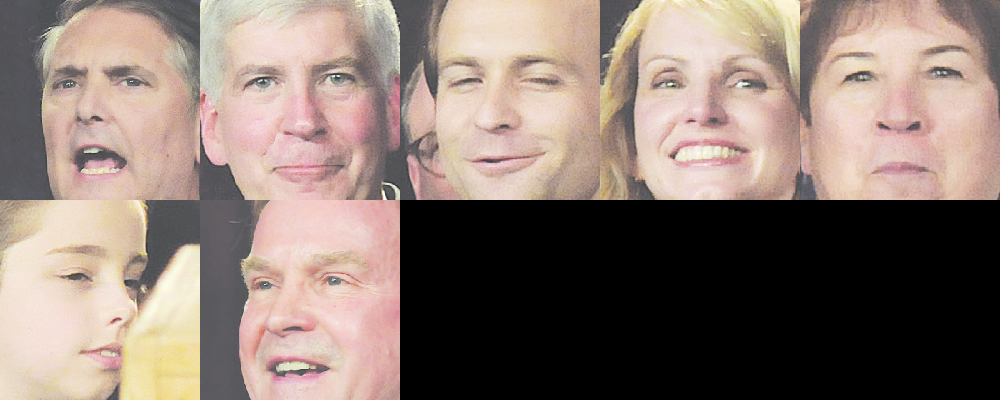

Results found in file a-3.png


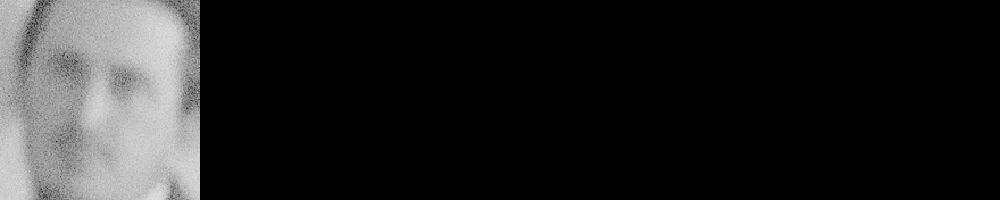

In [4]:
word_search("Christopher", dict_small)

#### Searching for "Mark" in articles and return faces found

Results found in file a-0.png


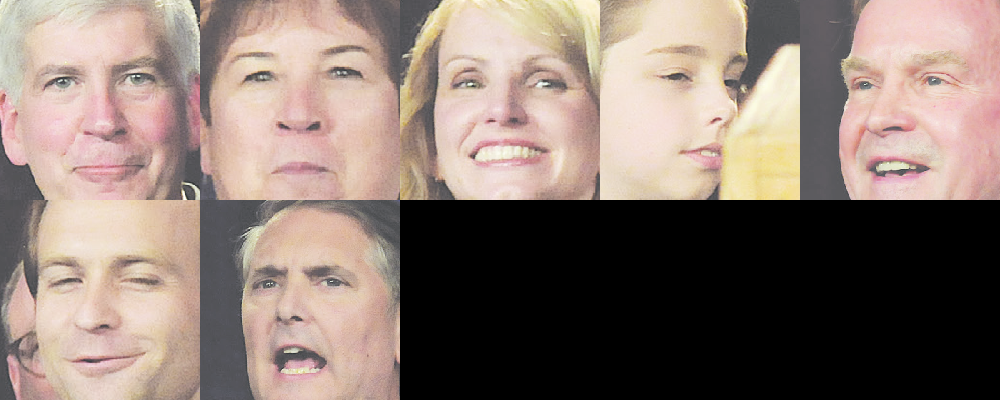

Results found in file a-1.png


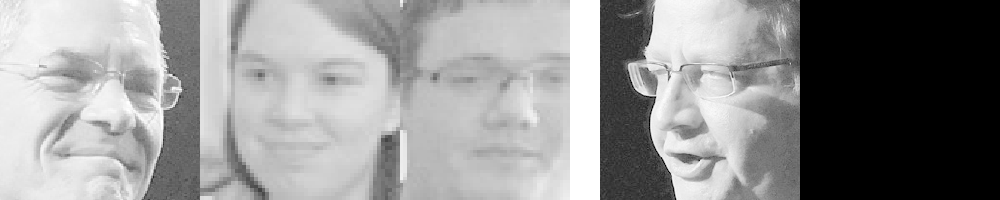

Results found in file a-2.png


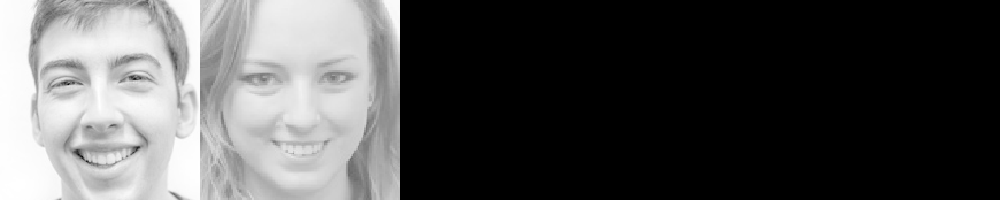

Results found in file a-3.png


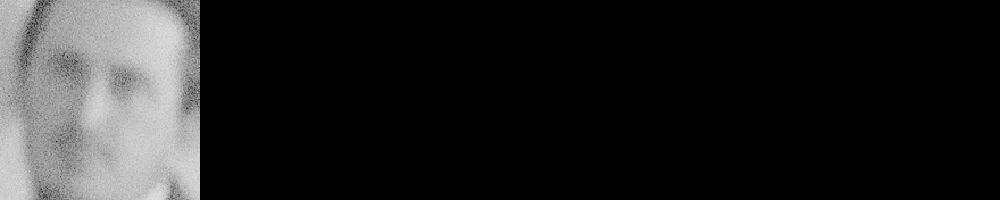

Results found in file a-8.png
But there were not faces in that file!


In [12]:
word_search("Mark", dict_large)

In [15]:
len(dict_large["a-13.png"].get("faces"))

1

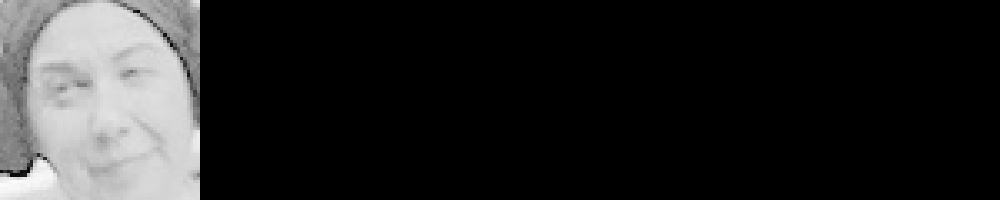

In [17]:

print_faces(dict_large["a-13.png"].get("image"),dict_large["a-13.png"].get("faces") )

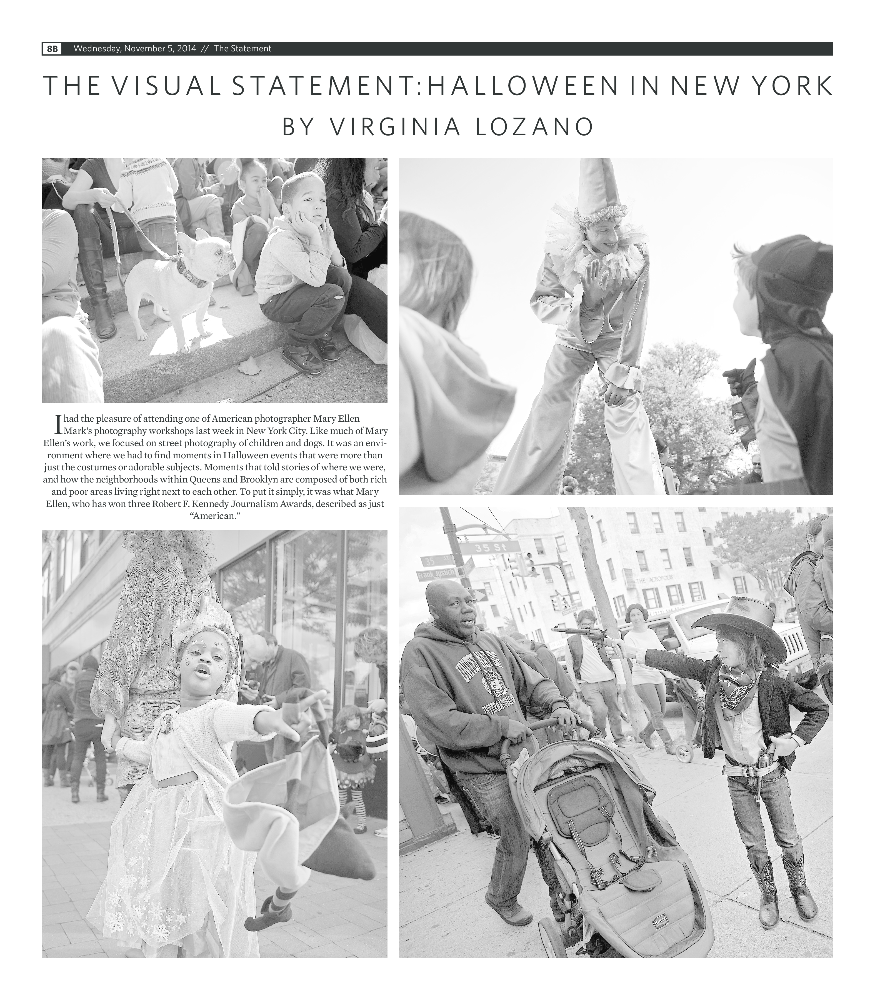

In [14]:
display(dict_large["a-13.png"].get("image"))

In [18]:
print(dict_large["a-13.png"].get("text"))

['THE', 'VISUALSTATEMENT:', 'HALLOWEEN', 'IN', 'NEW', 'YORK', 'BY', 'VIRGINIA', 'LOZANO', 'had', 'the', 'pleasure', 'of', 'attending', 'one', 'of', 'American', 'photographer', 'Mary', 'Ellen', 'Mark’s', 'photography', 'workshops', 'last', 'week', 'in', 'New', 'York', 'City.', 'Like', 'much', 'of', 'Mary', 'Ellen’s', 'work,', 'we', 'focused', 'on', 'street', 'photography', 'of', 'children', 'and', 'dogs.', 'It', 'was', 'an', 'envi-', 'ronment', 'where', 'we', 'had', 'to', 'find', 'moments', 'in', 'Halloween', 'events', 'that', 'were', 'more', 'than', 'just', 'the', 'costumes', 'or', 'adorable', 'subjects.', 'Moments', 'that', 'told', 'stories', 'of', 'where', 'we', 'were,', 'and', 'how', 'the', 'neighborhoods', 'within', 'Queens', 'and', 'Brooklyn', 'are', 'composed', 'of', 'both', 'rich', 'and', 'poor', 'areas', 'living', 'right', 'next', 'to', 'each', 'other.', 'To', 'put', 'it', 'simply,', 'it', 'was', 'what', 'Mary', 'Ellen,', 'who', 'has', 'won', 'three', 'Robert', 'F.', 'Kennedy',

In [27]:
word = "Mark"
for w in dict_large["a-13.png"].get("text"):
    if word.lower() in w.lower():
        print(word)
    


Mark


In [25]:
[w.lower() for w in dict_large["a-13.png"].get("text") if w.lower() == word.lower()]

[]

In [ ]:
[w.lower() for w in dict_large["a-13.png"].get("text") if w.lower() == word.lower()]